# Quantitative Phase (QP) Workflow - Multifile
This notebook demonstrates a 3D/4D-ready pipeline:

1. **QP retrieval** on 3D data only (from a specified brightfield channel if 4D)
2. **Segmentation** using all available data
3. **Focal plane determination** using the 3D QP data
4. **Dry mass conversion** from QP

> Replace the QP retrieval stub with your own method if available.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Import the librarys
import sys
sys.path.append('/mnt/data')
import quantphase_pipeline as qpp
from tpr import phase_structure

import torch
torch.cuda.empty_cache()



Welcome to CellposeSAM, cellpose v
cellpose version: 	4.0.6 
platform:       	win32 
python version: 	3.11.13 
torch version:  	2.7.1+cu118! The neural network component of
CPSAM is much larger than in previous versions and CPU excution is slow. 
We encourage users to use GPU/MPS if available. 




## Load or synthesize data
Provide either a 3D array `(z,y,x)` or a 4D array `(c,z,y,x)`.
Below we synthesize a simple 4D dataset with two channels.

In [2]:
import os
from tkinter import filedialog
from tkinter import *

from skimage import io

def select_file(filepath=""):
    if not os.path.exists(filepath):
        # ask for user input for calibraiton
        root = Tk()
        root.withdraw()
        pathobject = filedialog.askopenfile(title='Select volumetric brightfield data', filetypes =[('image file', ['*.tif', '*.tiff'])])
        filepath = pathobject.name
        root.destroy()
    ht = os.path.split(filepath)
    path, fname = ht[0], ht[1]
    print(f"Selected file: {fname} from path {path}")
    return path, fname

def load_data(filename):
    return io.imread(filename)

def select_folder(path=None):
    if path is None or not os.path.exists(path):
        # ask for user input for calibraiton
        root = Tk()
        root.withdraw()
        path = filedialog.askdirectory(title='Select folder with volumetric brightfield data')
        root.destroy()
    print(f"Selected folder: {path}")
    return path


## Configure and run the pipeline

In [3]:
s=phase_structure()

# either write a metadata parser or set variables explicitly here
# 40x water immersion
dz = 0.160  # z step size in microns
pixelsize = 0.165 # pixel size in microns

# 60x water immersion
#dz = 0.1  # z step size in microns
#pixelsize = 0.102 # pixel size in microns

s.optics_dz = dz
s.optics_dx = pixelsize
s.optics_NA = 1.2 # numerical aperture
s.optics_NA_ill = 0.26 # illumination NA
s.optics_dlambda = 0.04
s.optics_wv = 0.55 # wavelength in microns
s.optics_alpha = 4.21 
phase_structure.summarise(s)


Phase structure: 
_________________
s.optics_dx = 0.165 	 	 s.optics_wv = 0.55
s.optics_dz = 0.16 	 	 s.optics_dlambda = 0.04
s.optics_NA = 1.2 	 	 s.optics_alpha = 4.21
s.optics_NA_ill = 0.26 	 	 s.optics_kzT = 0.01
s.optics_n = 1.406
Processing paramters: 
_________________
s.proc_mirrorX = False 	 	 s.proc_mirrorZ = False
s.proc_applyFourierMask = True


# folder selection

In [4]:
path = r'F:\irene\v1_20251022' #select_folder()
filenames = [f for f in os.listdir(path) if f.endswith('.tif') or f.endswith('.tiff')]
filenames.sort()

2025-11-12 17:59:12,595 [INFO] WRITING LOG OUTPUT TO C:\Users\LocalAdmin\.cellpose\run.log
2025-11-12 17:59:12,596 [INFO] 
cellpose version: 	4.0.6 
platform:       	win32 
python version: 	3.11.13 
torch version:  	2.7.1+cu118
2025-11-12 17:59:12,867 [INFO] ** TORCH CUDA version installed and working. **
>>> GPU activated? YES
2025-11-12 17:59:12,868 [WARNING] model_type argument is not used in v4.0.1+. Ignoring this argument...
2025-11-12 17:59:12,869 [INFO] ** TORCH CUDA version installed and working. **
2025-11-12 17:59:12,870 [INFO] >>>> using GPU (CUDA)
2025-11-12 17:59:14,936 [INFO] >>>> loading model C:\Users\LocalAdmin\.cellpose\models\cpsam
Finished loading, shape: (2048, 2048, 3), dtype: uint16
Skipping processing file: fp_450_1.tif, only 2D data found
Finished loading, shape: (2048, 2048, 3), dtype: uint16
Skipping processing file: fp_CTL_cells_detached_2.tif, only 2D data found
Finished loading, shape: (200, 1024, 1024, 3), dtype: uint16
Stack shape after permutation: (102

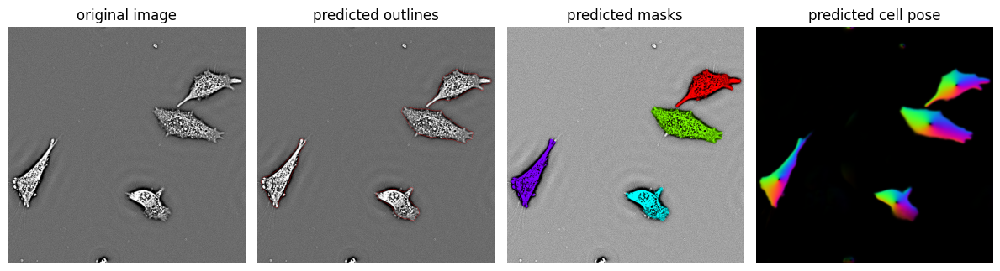

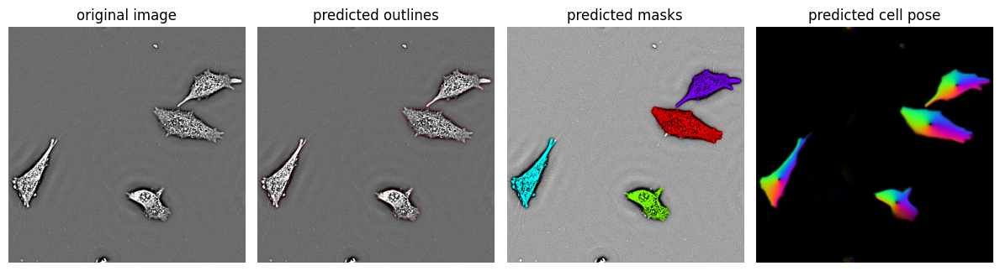

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_1_segmentation.png


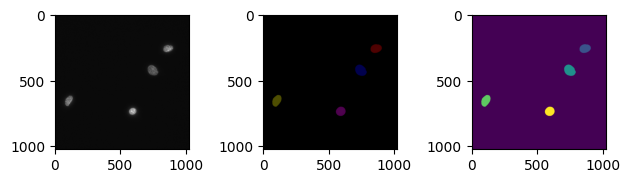

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_1_nucleus_segmentation.png
Processing region 1/4
Processing region 2/4
Processing region 3/4
Processing region 4/4
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_cell_4.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_1_cell_data.csv
Processing region 1/4
Processing region 2/4
Processing region 3/4
Processing region 4/4
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_nucleus_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_nucleus_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_nucleus_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_1_nucleus_cell_4.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_1_nucleus_cell_data.csv
Finished loa

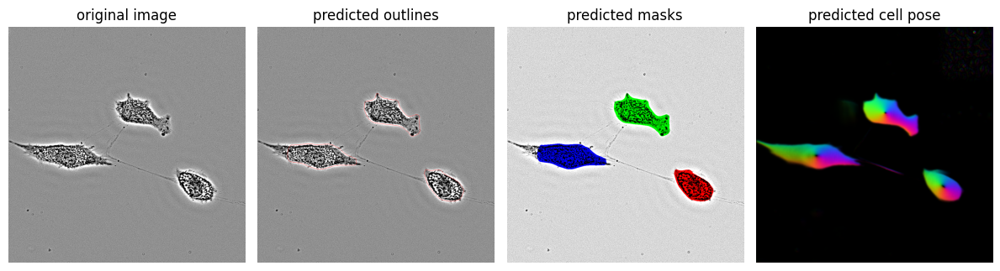

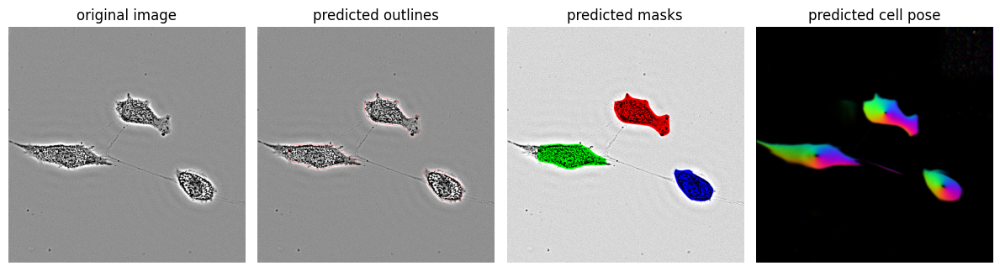

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_2_segmentation.png


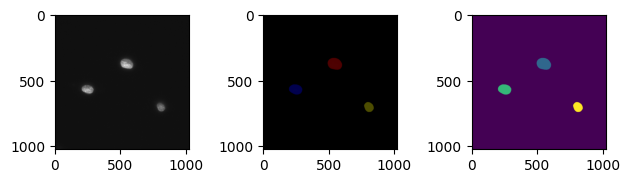

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_2_nucleus_segmentation.png
Processing region 1/3
Processing region 2/3
Processing region 3/3
Saved cell image to F:\irene\v1_20251022\QP\stack_450_2_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_2_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_2_cell_3.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_2_cell_data.csv
Processing region 1/3
Processing region 2/3
Processing region 3/3
Saved cell image to F:\irene\v1_20251022\QP\stack_450_2_nucleus_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_2_nucleus_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_2_nucleus_cell_3.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_2_nucleus_cell_data.csv
Finished loading, shape: (200, 1024, 1024, 3), dtype: uint16
Stack shape after permutation: (1024, 1024, 200)
Stack shape after cropping: (1024, 1024, 200)
Inverted stack for QP retrieval
Stack shap

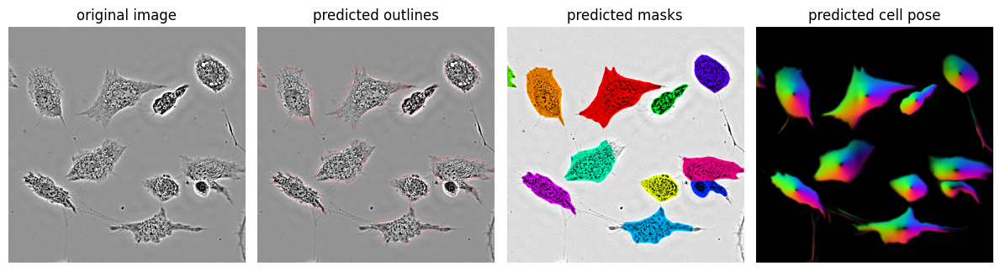

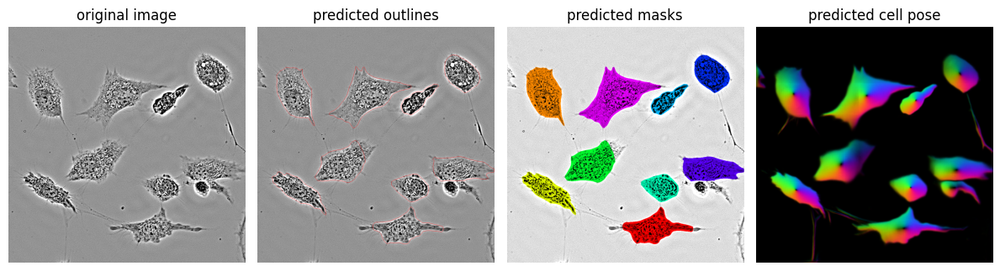

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_3_segmentation.png


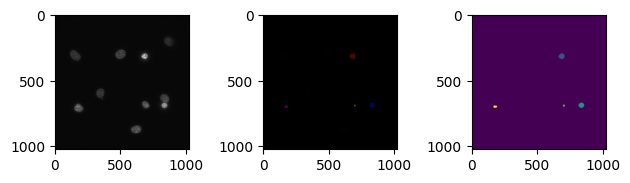

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_3_nucleus_segmentation.png
Processing region 1/9
Processing region 2/9
Processing region 3/9
Processing region 4/9
Processing region 5/9
Processing region 6/9
Processing region 7/9
Processing region 8/9
Processing region 9/9
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_8.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_3_cell_9.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_3_cell_data.csv
Processing region 1/3
Processing reg

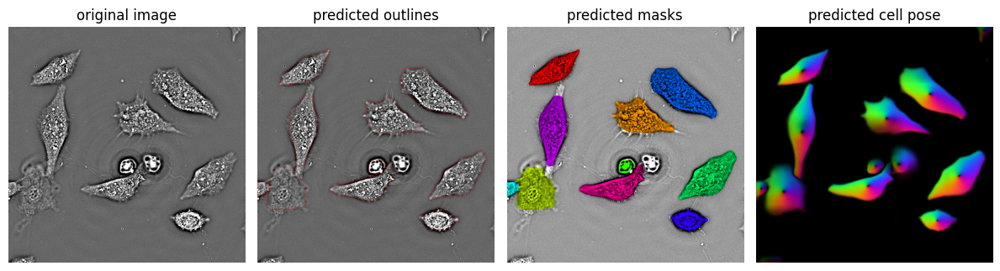

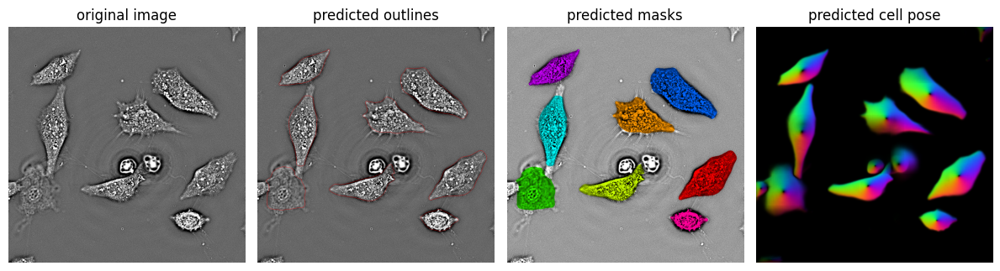

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_4_segmentation.png


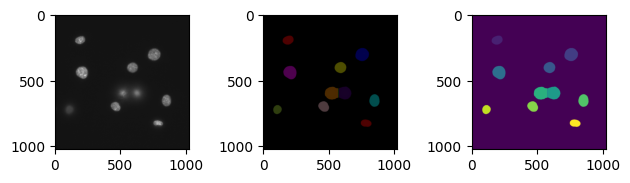

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_4_nucleus_segmentation.png
Processing region 1/8
Processing region 2/8
Processing region 3/8
Processing region 4/8
Processing region 5/8
Processing region 6/8
Processing region 7/8
Processing region 8/8
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_4_cell_8.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_4_cell_data.csv
Processing region 1/8
Processing region 2/8
Processing region 3/8
Processing region 4/8
Processing region 5/8
Processing regi

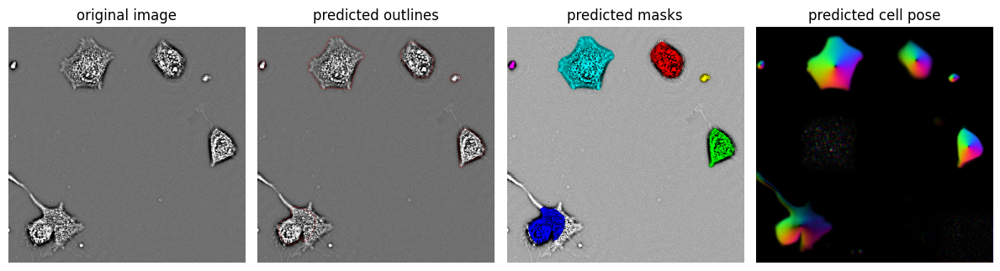

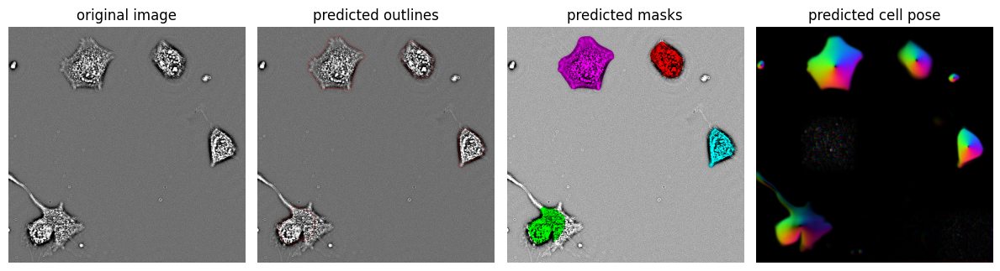

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_5_segmentation.png


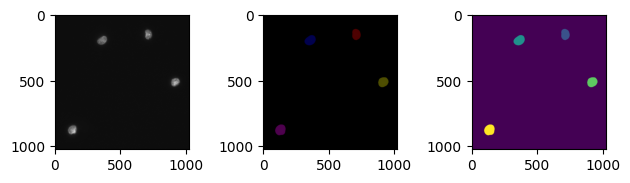

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_5_nucleus_segmentation.png
Processing region 1/4
Processing region 2/4
Processing region 3/4
Processing region 4/4
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_cell_4.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_5_cell_data.csv
Processing region 1/4
Processing region 2/4
Processing region 3/4
Processing region 4/4
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_nucleus_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_nucleus_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_nucleus_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_5_nucleus_cell_4.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_5_nucleus_cell_data.csv
Finished loa

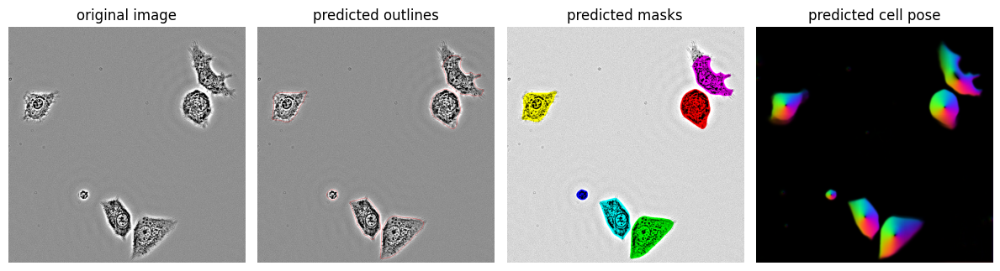

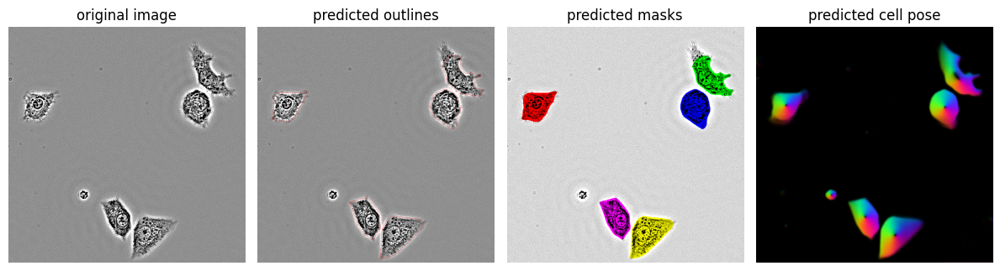

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_6_segmentation.png


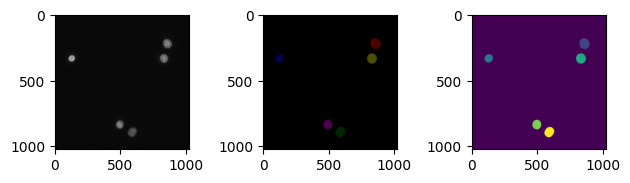

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_450_6_nucleus_segmentation.png
Processing region 1/5
Processing region 2/5
Processing region 3/5
Processing region 4/5
Processing region 5/5
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_cell_5.png
Saved dry mass data to F:\irene\v1_20251022\QP\stack_450_6_cell_data.csv
Processing region 1/5
Processing region 2/5
Processing region 3/5
Processing region 4/5
Processing region 5/5
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_nucleus_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_nucleus_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_nucleus_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_450_6_n

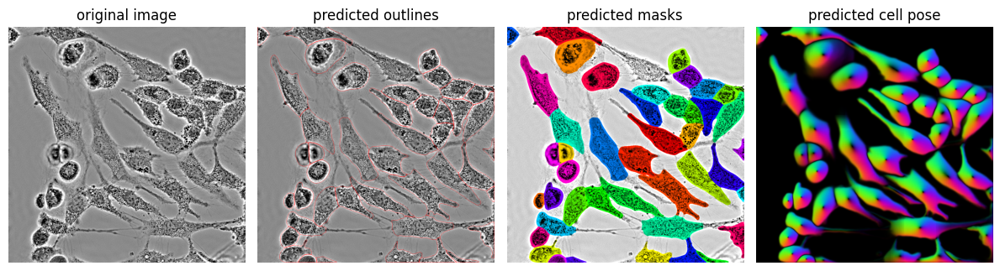

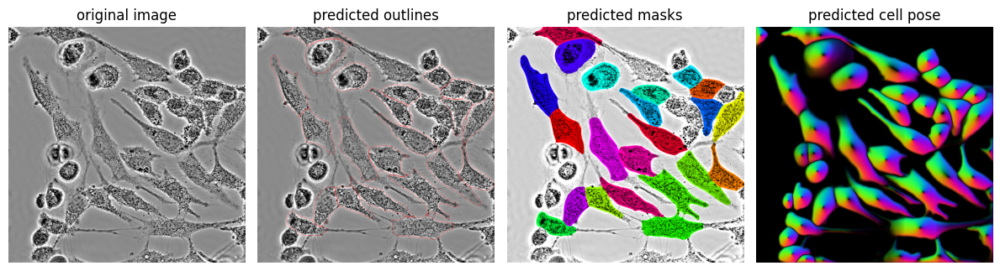

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_1_segmentation.png


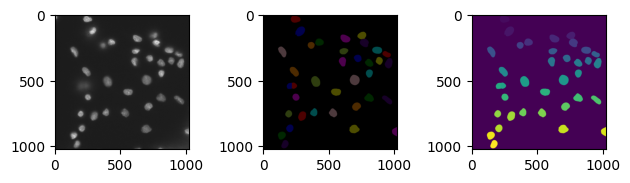

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_segmentation.png
Processing region 1/22
Processing region 2/22
Processing region 3/22
Processing region 4/22
Processing region 5/22
Processing region 6/22
Processing region 7/22
Processing region 8/22
Processing region 9/22
Processing region 10/22
Processing region 11/22
Processing region 12/22
Processing region 13/22
Processing region 14/22
Processing region 15/22
Processing region 16/22
Processing region 17/22
Processing region 18/22
Processing region 19/22
Processing region 20/22
Processing region 21/22


e:\GitHub\dry_mass\quantphase_pipeline.py:315: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(dpi=100, constrained_layout=True)


Processing region 22/22
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_8.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_9.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_10.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_11.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_12.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_13.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_cell_14.png
Saved cell image to F:\irene\v1_2

e:\GitHub\dry_mass\quantphase_pipeline.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(dpi=100, constrained_layout=True)


Processing region 22/23
Processing region 23/23
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_8.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_9.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_10.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_11.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_1_nucleus_cell_12.png
Saved cell image to F:\irene\v1_20251022\QP\stack

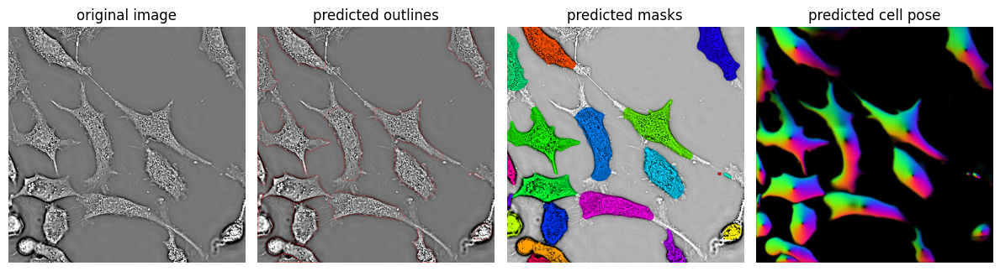

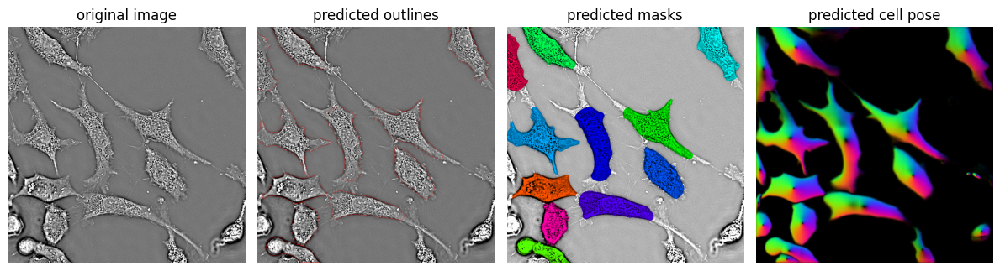

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_2_segmentation.png


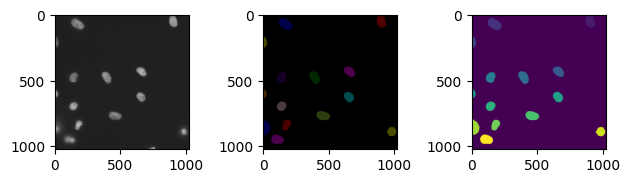

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_2_nucleus_segmentation.png
Processing region 1/11
Processing region 2/11
Processing region 3/11
Processing region 4/11
Processing region 5/11
Processing region 6/11
Processing region 7/11
Processing region 8/11
Processing region 9/11
Processing region 10/11
Processing region 11/11
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_8.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_2_cell_9.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CT

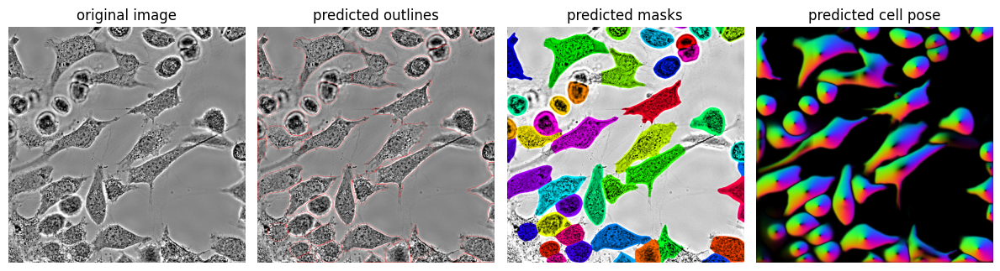

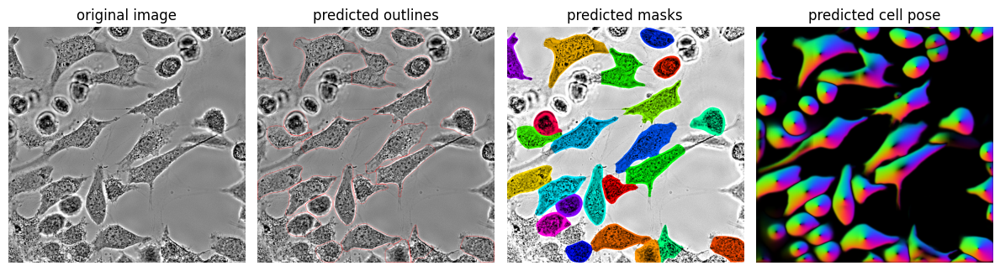

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_3_segmentation.png


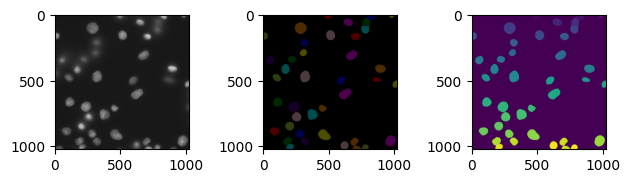

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_segmentation.png
Processing region 1/23
Processing region 2/23
Processing region 3/23
Processing region 4/23
Processing region 5/23
Processing region 6/23
Processing region 7/23
Processing region 8/23
Processing region 9/23
Processing region 10/23
Processing region 11/23
Processing region 12/23
Processing region 13/23
Processing region 14/23
Processing region 15/23
Processing region 16/23
Processing region 17/23
Processing region 18/23
Processing region 19/23
Processing region 20/23
Processing region 21/23


e:\GitHub\dry_mass\quantphase_pipeline.py:315: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(dpi=100, constrained_layout=True)


Processing region 22/23
Processing region 23/23
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_8.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_9.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_10.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_11.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_12.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_13.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_cell_14.png
Saved cel

e:\GitHub\dry_mass\quantphase_pipeline.py:364: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(dpi=100, constrained_layout=True)


Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_8.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_9.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_10.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_11.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_12.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_13.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_3_nucleus_cell_14.png
Saved cell image to 

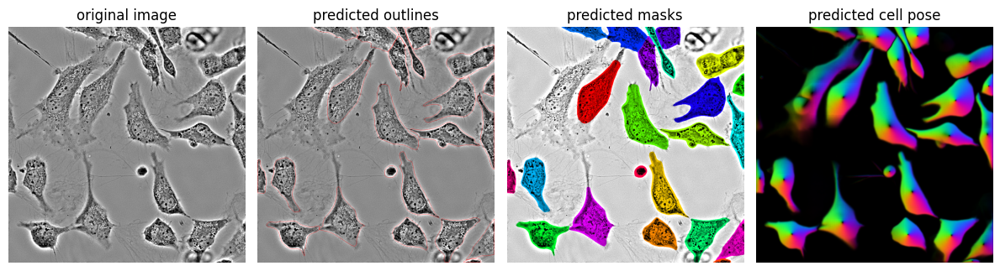

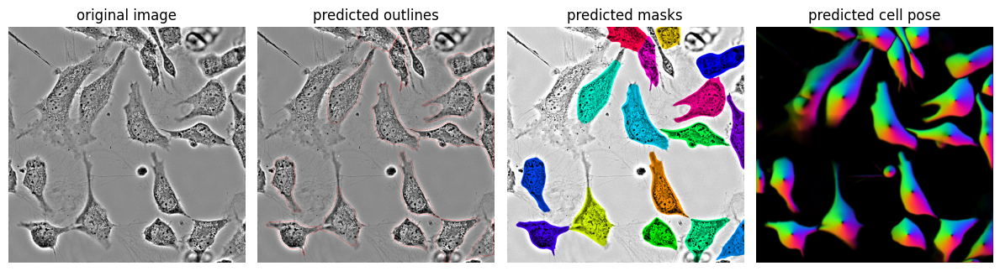

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_5_segmentation.png


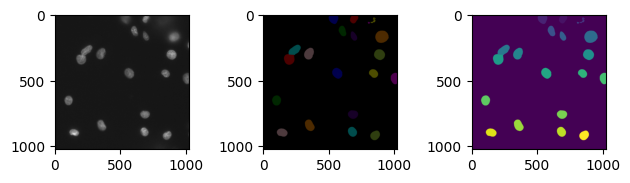

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_5_nucleus_segmentation.png
Processing region 1/16
Processing region 2/16
Processing region 3/16
Processing region 4/16
Processing region 5/16
Processing region 6/16
Processing region 7/16
Processing region 8/16
Processing region 9/16
Processing region 10/16
Processing region 11/16
Processing region 12/16
Processing region 13/16
Processing region 14/16
Processing region 15/16
Processing region 16/16
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_5_cell_8.png

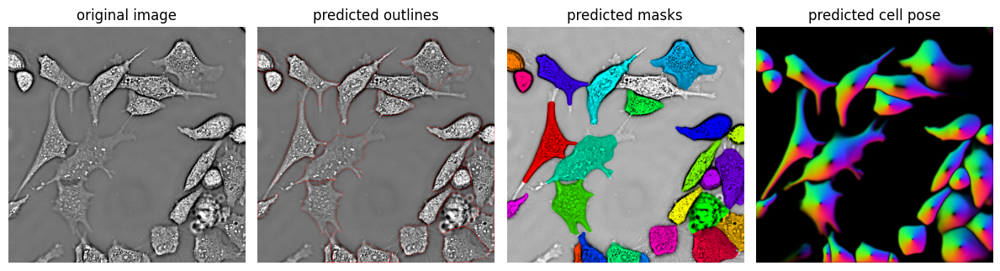

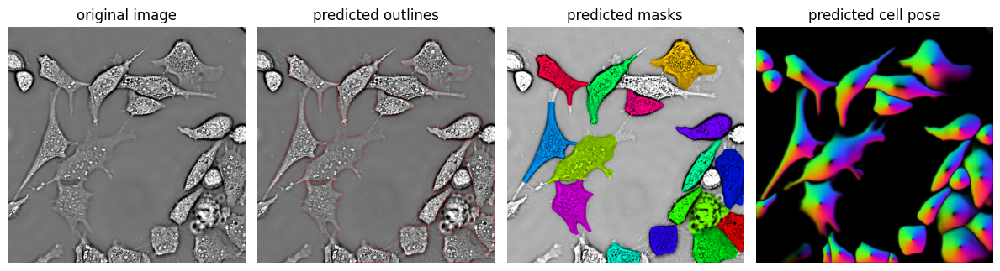

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_7_segmentation.png


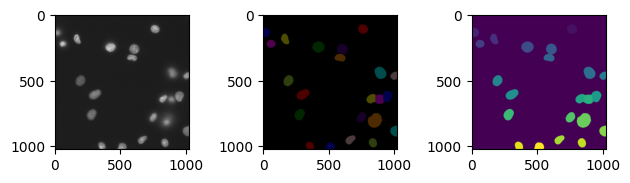

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_7_nucleus_segmentation.png
Processing region 1/16
Processing region 2/16
Processing region 3/16
Processing region 4/16
Processing region 5/16
Processing region 6/16
Processing region 7/16
Processing region 8/16
Processing region 9/16
Processing region 10/16
Processing region 11/16
Processing region 12/16
Processing region 13/16
Processing region 14/16
Processing region 15/16
Processing region 16/16
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_1.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_2.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_3.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_4.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_5.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_6.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_7.png
Saved cell image to F:\irene\v1_20251022\QP\stack_CTL_7_cell_8.png

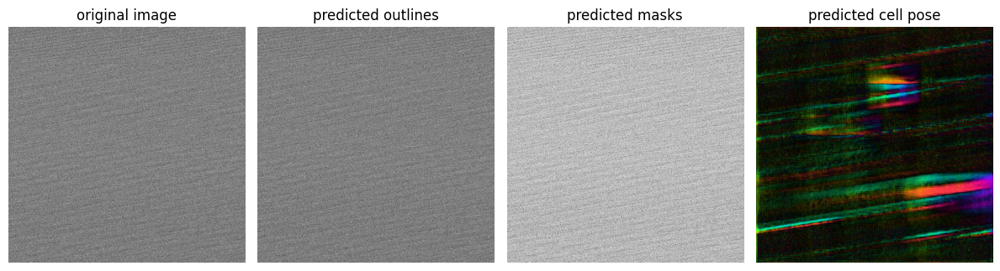

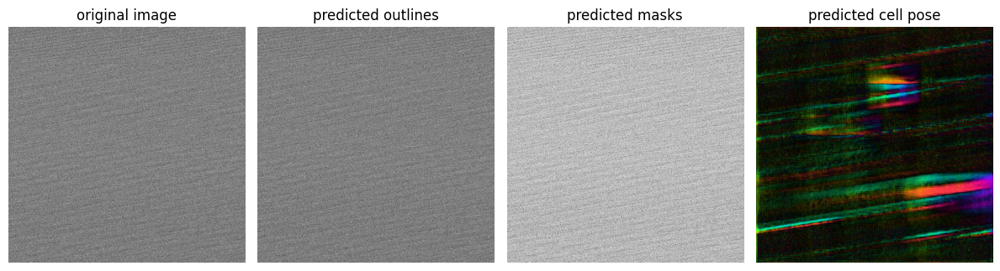

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_asymVoxel_segmentation.png


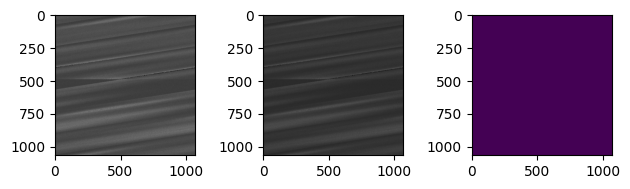

Saved segmentation figure to F:\irene\v1_20251022\QP\stack_CTL_asymVoxel_nucleus_segmentation.png
2025-11-12 18:07:18,909 [WARNING] no masks found, will not save PNG or outlines
2025-11-12 18:07:18,957 [WARNING] no masks found, will not save PNG or outlines
Finished loading, shape: (184, 326, 340, 3), dtype: uint16
Stack shape after permutation: (326, 340, 184)
Stack shape after cropping: (326, 326, 184)
Inverted stack for QP retrieval
Stack shape after permutation: (326, 340, 184)
Stack shape after cropping: (326, 326, 184)
Inverted stack for QP retrieval
Stack shape after permutation: (326, 340, 184)
Stack shape after cropping: (326, 326, 184)
Inverted stack for QP retrieval
Updated shape: (326, 326, 184)
creating new log file
2025-11-12 18:07:22,018 [INFO] WRITING LOG OUTPUT TO C:\Users\LocalAdmin\.cellpose\run.log
2025-11-12 18:07:22,019 [INFO] 
cellpose version: 	4.0.6 
platform:       	win32 
python version: 	3.11.13 
torch version:  	2.7.1+cu118
2025-11-12 18:07:22,021 [INFO] **

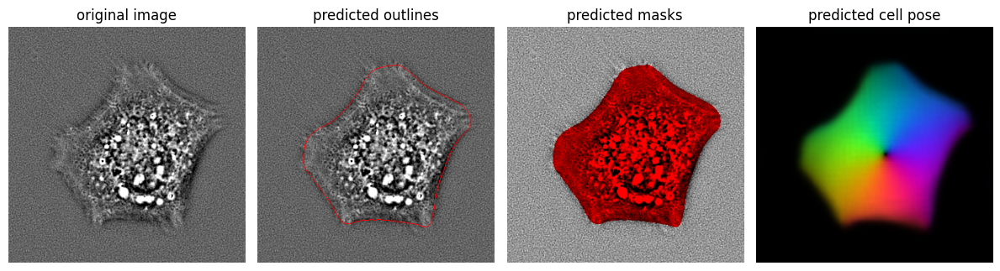

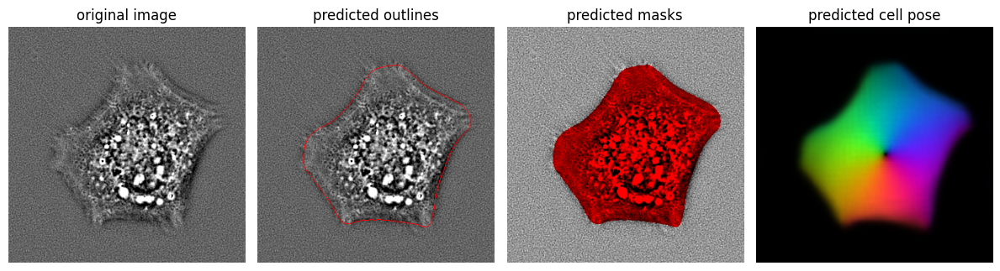

Saved segmentation figure to F:\irene\v1_20251022\QP\test_segmentation.png


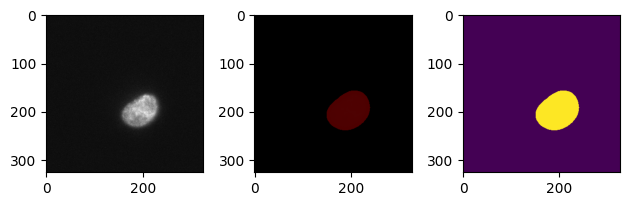

Saved segmentation figure to F:\irene\v1_20251022\QP\test_nucleus_segmentation.png
Processing region 1/1
Saved cell image to F:\irene\v1_20251022\QP\test_cell_1.png
Saved dry mass data to F:\irene\v1_20251022\QP\test_cell_data.csv
Processing region 1/1
Saved cell image to F:\irene\v1_20251022\QP\test_nucleus_cell_1.png
Saved dry mass data to F:\irene\v1_20251022\QP\test_nucleus_cell_data.csv


In [ ]:
model_type = 'cyto'
cp_model = qpp.setup_cellpose_model(model_type=model_type) 

for filename in filenames:
    #path, filename = select_file()
    stack = load_data(os.path.join(path, filename))
    print(f"Finished loading, shape: {stack.shape}, dtype: {stack.dtype}")
    if len(stack.shape) == 3:
        print(f"Skipping processing file: {filename}, only 2D data found")
        continue

    path_out = os.path.join(path, "QP")
    file_id = filename.split('.')[0] 
    file_out = file_id + "_QP.tif"

    cfg = qpp.PipelineConfig(
        channel_bf=0,
        seg_reduce='focal',
        model_type='cyto',
        wavelength_m=550e-9,
        alpha_m3_per_g=0.18e-6,
        pixel_size_m=160e-9,
        ps=s,
        flow_threshold=0.4,
        cell_threshold=-1.0, 
        invert_stack = True, 
        overwrite_qp=False,
        segment_nucleus=True,
        channel_nuc=1, 
        cell_area_threshold=10000
        )

    #try:
    outputs = qpp.run_pipeline(stack, cfg, filename=filename, path_save=path_out)
    outputs.z_focal, [(f['mass'], f['area']) for f in outputs.dry_masses.values()]
    #except:
    #    print(f"Skipping processing file: {filename}")